In [10]:
import os, sys
sys.path.append("..")

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

import numpy as np
import torch
import torch.nn as nn
import torchvision
import gc

from src.tools import freeze
from src.tools import load_dataset
from src.cunet import CUNet

import json

from tqdm import tqdm_notebook as tqdm
from IPython.display import clear_output
from collections import OrderedDict

# This needed to use dataloaders for some datasets
from PIL import PngImagePlugin
LARGE_ENOUGH_NUMBER = 100
PngImagePlugin.MAX_TEXT_CHUNK = LARGE_ENOUGH_NUMBER * (1024**2)

## Main Config

In [11]:
DEVICE_ID = 3

# DATASET2, DATASET2_PATH = 'handbag', '../../data/handbag_128.hdf5'
DATASET2, DATASET2_PATH = 'shoes', '../../data/shoes_128.hdf5'
# DATASET1, DATASET1_PATH = 'celeba_female', '../../data/img_align_celeba'
# DATASET2, DATASET2_PATH = 'aligned_anime_faces', '../../data/aligned_anime_faces'
# DATASET1, DATASET1_PATH = 'outdoor', '../../data/outdoor_128.hdf5'
# DATASET2, DATASET2_PATH = 'church', '../../data/church_128.hdf5'
DATASET1, DATASET1_PATH = 'dtd', '../../data/dtd/images'

IMG_SIZE = 128
COST = 'energy' #'weak_mse'

ZC, Z_STD = 128, 1.
    
assert torch.cuda.is_available()
# torch.cuda.set_device(f'cuda:{DEVICE_ID}')

In [12]:
_, X_test_sampler = load_dataset(DATASET1, DATASET1_PATH, img_size=IMG_SIZE)
# _, Y_test_sampler = load_dataset(DATASET2, DATASET2_PATH, img_size=IMG_SIZE) <-- not needed in this notebook
    
T = CUNet(3, 3, ZC, base_factor=48)
pass

In [13]:
folder = os.path.join('../checkpoints', COST, '{}_{}_{}'.format(DATASET1, DATASET2, IMG_SIZE))
model = 'T.pt'
path = os.path.join(folder, model)

In [32]:
folder

'../checkpoints/energy/dtd_shoes_128'

In [14]:
device = 'cuda:0'

T.load_state_dict(torch.load(path))
T.to(device); freeze(T)

In [15]:
import h5py
import numpy as np
from tqdm import tqdm
import gc

import torch
from torch.utils.data import TensorDataset
from torch.autograd import Variable
import torch.nn.functional as F

from torchvision.transforms import Compose, Resize, Normalize, ToTensor, \
    RandomResizedCrop, RandomHorizontalFlip, RandomVerticalFlip
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset, DataLoader
import torch.nn as nn

def h5py_to_dataset(path, img_size=64):
    with h5py.File(path, "r") as f:
        # List all groups
        print("Keys: %s" % f.keys())
        a_group_key = list(f.keys())[0]

        # Get the data
        data = list(f[a_group_key])
    with torch.no_grad():
        dataset = 2 * (torch.tensor(np.array(data), dtype=torch.float32) / 255.).permute(0, 3, 1, 2) - 1
        dataset = F.interpolate(dataset, img_size, mode='bilinear')

    return TensorDataset(dataset, torch.zeros(len(dataset)))


def load_dataset(name, path, img_size=64, batch_size=64, test_ratio=0.1):
    if name in ['shoes', 'handbag', 'outdoor', 'church']:
        dataset = h5py_to_dataset(path, img_size)
    elif name in ['celeba_female', 'celeba_male', 'aligned_anime_faces']:
        transform = Compose([Resize((img_size, img_size)), ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
        dataset = ImageFolder(path, transform=transform)
    elif name in ['dtd']:
        transform = Compose(
            [Resize(300), RandomResizedCrop((img_size,img_size), scale=(128./300, 1.), ratio=(1., 1.)),
             RandomHorizontalFlip(0.5), RandomVerticalFlip(0.5),
             ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
        )
        dataset = ImageFolder(path, transform=transform)

    if name in ['celeba_female', 'celeba_male']:
        with open('datasets/list_attr_celeba.txt', 'r') as f:
            lines = f.readlines()[2:]
        if name == 'celeba_female':
            idx = [i for i in list(range(len(lines))) if lines[i].replace('  ', ' ').split(' ')[21] == '-1']
        else:
            idx = [i for i in list(range(len(lines))) if lines[i].replace('  ', ' ').split(' ')[21] != '-1']
    else:
        idx = list(range(len(dataset)))

    test_size = int(len(idx) * test_ratio)
    train_idx, test_idx = idx[:-test_size], idx[-test_size:]
    train_set, test_set = Subset(dataset, train_idx), Subset(dataset, test_idx)

    train_dataloader = DataLoader(train_set, shuffle=True, num_workers=8, batch_size=batch_size)
    test_dataloader = DataLoader(test_set, shuffle=True, num_workers=8, batch_size=batch_size)
    return train_dataloader, test_dataloader


class Sampler:
    def __init__(
            self, device='cuda',
    ):
        self.device = device

    def sample(self, size=5):
        pass


class LoaderSampler(Sampler):
    def __init__(self, loader, device='cuda'):
        super(LoaderSampler, self).__init__(device)
        self.loader = loader
        self.it = iter(self.loader)

    def sample(self, size=5):
        assert size <= self.loader.batch_size
        try:
            batch, _ = next(self.it)
        except StopIteration:
            self.it = iter(self.loader)
            return self.sample(size)
        if len(batch) < size:
            return self.sample(size)

        return batch[:size].to(self.device)

In [20]:
DATASET1, DATASET1_PATH = 'dtd', '../../data/dtd/images'
DATASET2, DATASET2_PATH = 'shoes', '../../data/shoes_128.hdf5'

IMG_SIZE = 128

input_shape = (3, IMG_SIZE, IMG_SIZE)

torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

Keys: <KeysViewHDF5 ['imgs']>


In [24]:
def tensor2img(tensor):
    return tensor.to('cpu').permute(0, 2, 3, 1).mul(0.5).add(0.5).numpy().clip(0, 1)

In [29]:
T_XZ.shape

(12, 4, 3, 128, 128)

Keys: <KeysViewHDF5 ['imgs']>


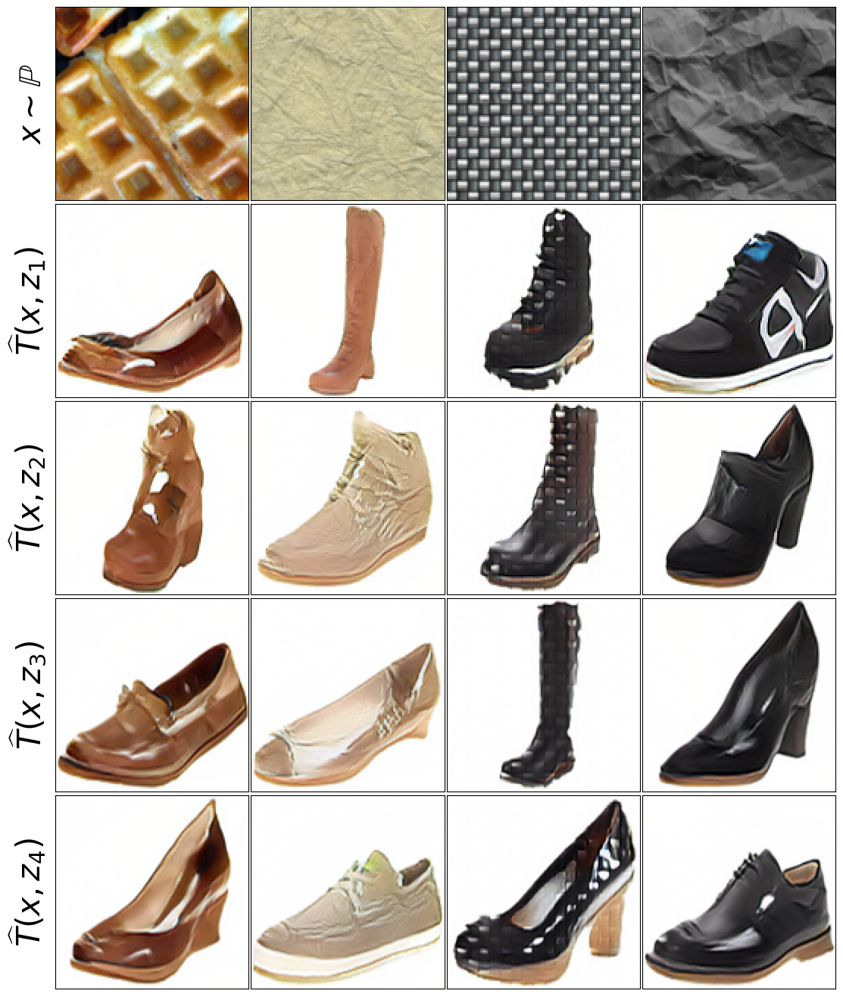

In [40]:
DATASET1, DATASET1_PATH = 'dtd', '../../data/dtd/images'
DATASET2, DATASET2_PATH = 'shoes', '../../data/shoes_128.hdf5'

folder = os.path.join('../checkpoints', COST, '{}_{}_{}'.format(DATASET1, DATASET2, IMG_SIZE))
model = 'T.pt'
path = os.path.join(folder, model)

IMG_SIZE = 128
COST = 'energy' #'weak_mse'

ZC, Z_STD = 128, 1.

device = 'cuda:0'

T.load_state_dict(torch.load(path))
T.to(device); freeze(T)

torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)


train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

n_batches = min(len(train_loader_a), len(train_loader_b))

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)
X_fixed = X_sampler.sample(12)
Y_fixed = Y_sampler.sample(12)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

num_examples = 4
Y_test_fakes = []

X_test_fixed_2 = X_test_fixed[:4,None].repeat(1,4,1,1,1)

Z = torch.randn(4, 4, ZC, 1, 1, device='cuda') * Z_STD
T_XZ = T(
        X_test_fixed_2.flatten(start_dim=0, end_dim=1), Z.flatten(start_dim=0, end_dim=1)
    ).permute(1,2,3,0).reshape(3, IMG_SIZE, IMG_SIZE, -1, 4).permute(3,4,0,1,2)

fig, axes = plt.subplots(5, 4, figsize=(11, 13), dpi=100)
X_tensor = tensor2img(X_test_fixed)

for j in range(4):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])
    #axes[0][j].get_yaxis().set_visible(False)

for i in range(4):
    for j in range(4):
        cur_img = T_XZ[j][i].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1).reshape(128, 128, 3)

        axes[i + 1][j].imshow(cur_img)
        axes[i + 1][j].get_xaxis().set_visible(False)
        axes[i + 1][j].set_yticks([])
        #axes[i + 1][j].get_yaxis().set_visible(False)
        
axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=30)
for j in range(4):
    title = '\widehat{T}(x,z_' + str(j+1) + ')'
    axes[j+1, 0].set_ylabel(r'${}$'.format(title), fontsize=30)
    
fig.tight_layout(pad=0.001)    
plt.savefig("knot_textures2shoes_test.png")

Keys: <KeysViewHDF5 ['imgs']>
Keys: <KeysViewHDF5 ['imgs']>


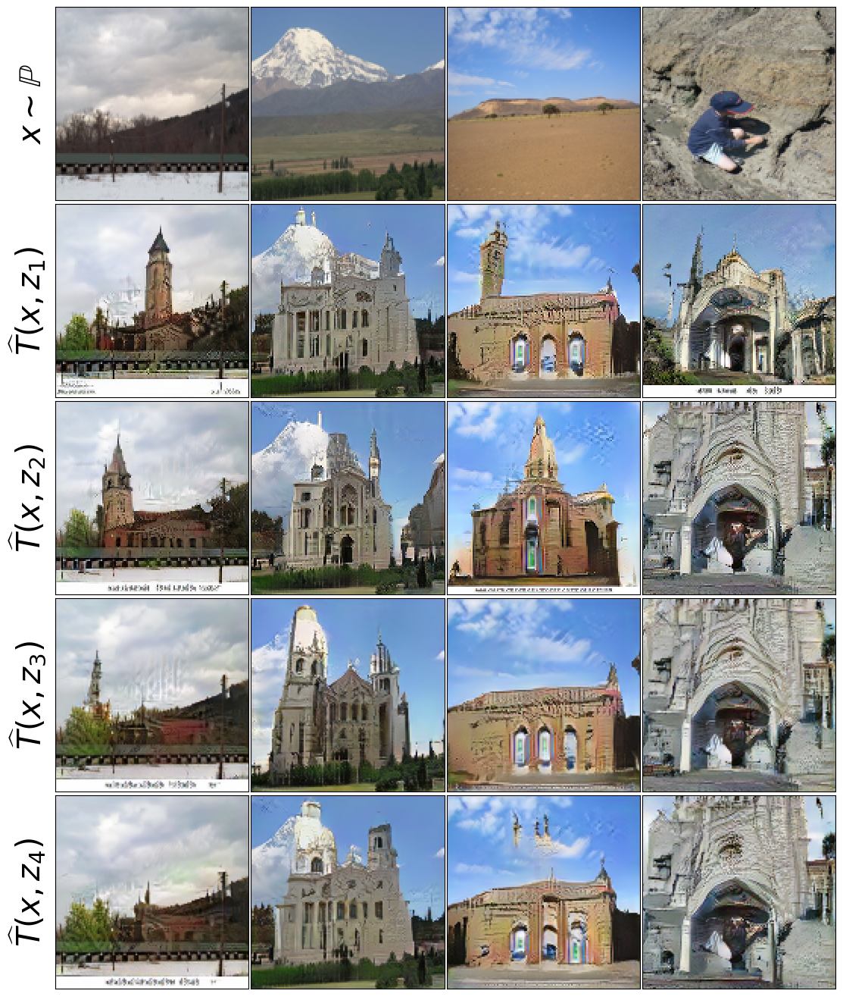

In [39]:
DATASET1, DATASET1_PATH = 'outdoor', '../../data/outdoor_128.hdf5'
DATASET2, DATASET2_PATH = 'church', '../../data/church_128.hdf5'

folder = os.path.join('../checkpoints', COST, '{}_{}_{}'.format(DATASET1, DATASET2, IMG_SIZE))
model = 'T.pt'
path = os.path.join(folder, model)

IMG_SIZE = 128
COST = 'energy' #'weak_mse'

ZC, Z_STD = 128, 1.

device = 'cuda:0'

T.load_state_dict(torch.load(path))
T.to(device); freeze(T)

IMG_SIZE = 128

train_loader_a, test_loader_a = load_dataset(DATASET1, DATASET1_PATH,
                                             img_size=IMG_SIZE, batch_size=32)
train_loader_b, test_loader_b = load_dataset(DATASET2, DATASET2_PATH,
                                             img_size=IMG_SIZE, batch_size=32)

torch.manual_seed(0xBADBEEF)
np.random.seed(0xBADBEEF)

X_sampler = LoaderSampler(train_loader_a, device=device)
X_test_sampler = LoaderSampler(test_loader_a, device=device)
Y_sampler = LoaderSampler(train_loader_b, device=device)
Y_test_sampler = LoaderSampler(test_loader_b, device=device)

X_test_fixed = X_test_sampler.sample(12)
Y_test_fixed = Y_test_sampler.sample(12)

num_examples = 4
Y_test_fakes = []

X_test_fixed_2 = X_test_fixed[:4,None].repeat(1,4,1,1,1)

Z = torch.randn(4, 4, ZC, 1, 1, device='cuda') * Z_STD
T_XZ = T(
        X_test_fixed_2.flatten(start_dim=0, end_dim=1), Z.flatten(start_dim=0, end_dim=1)
    ).permute(1,2,3,0).reshape(3, IMG_SIZE, IMG_SIZE, -1, 4).permute(3,4,0,1,2)

fig, axes = plt.subplots(5, 4, figsize=(11, 13), dpi=100)
X_tensor = tensor2img(X_test_fixed)

for j in range(4):
    axes[0][j].imshow(X_tensor[j])
    axes[0][j].get_xaxis().set_visible(False)
    axes[0][j].set_yticks([])
    #axes[0][j].get_yaxis().set_visible(False)

for i in range(4):
    for j in range(4):
        cur_img = T_XZ[j][i].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1).reshape(128, 128, 3)

        axes[i + 1][j].imshow(cur_img)
        axes[i + 1][j].get_xaxis().set_visible(False)
        axes[i + 1][j].set_yticks([])
        #axes[i + 1][j].get_yaxis().set_visible(False)
        
axes[0, 0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=30)
for j in range(4):
    title = '\widehat{T}(x,z_' + str(j+1) + ')'
    axes[j+1, 0].set_ylabel(r'${}$'.format(title), fontsize=30)
    
fig.tight_layout(pad=0.001)    
plt.savefig("knot_outdoors2church_test.png")

## Plotting checkpoints

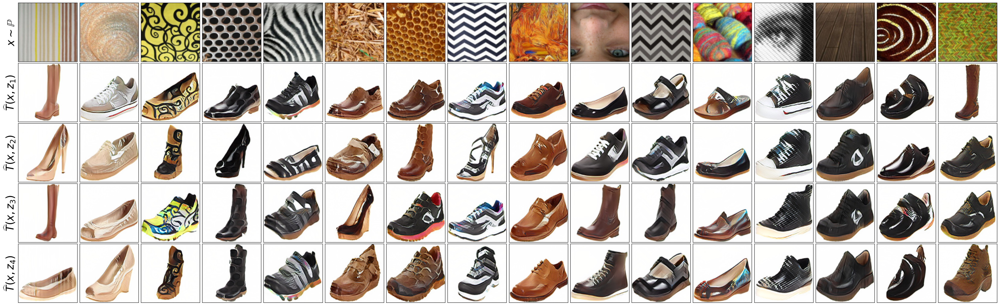

In [6]:
fig, axes = plt.subplots(5, 16, figsize=(16*2+1,10), dpi=100)   



X = X_test_sampler.sample(16)[:,None].repeat(1,4,1,1,1)

# CUNet
with torch.no_grad():
    Z = torch.randn(16, 4, ZC, 1, 1, device='cuda') * Z_STD
    T_XZ = T(
        X.flatten(start_dim=0, end_dim=1), Z.flatten(start_dim=0, end_dim=1)
    ).permute(1,2,3,0).reshape(3, IMG_SIZE, IMG_SIZE, -1, 4).permute(3,4,0,1,2)

with torch.no_grad():
    for i in range(16):
        axes[0,i].imshow(X[i, 0].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1))
        for j in range(4):
            axes[j+1,i].imshow(T_XZ[i,j].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1))

axes[0,0].set_ylabel(r'$x\sim\mathbb{P}$', fontsize=25 if IMG_SIZE==128 else 30)
for j in range(4):
    title = '\widehat{T}(x,z_' + str(j+1) + ')'
    axes[j+1,0].set_ylabel(r'${}$'.format(title), fontsize=25 if IMG_SIZE==128 else 30)

for i, ax in enumerate(axes.flatten()):
    ax.get_xaxis().set_visible(False)
    ax.set_yticks([])

fig.tight_layout(pad=0.001)
fig.show()

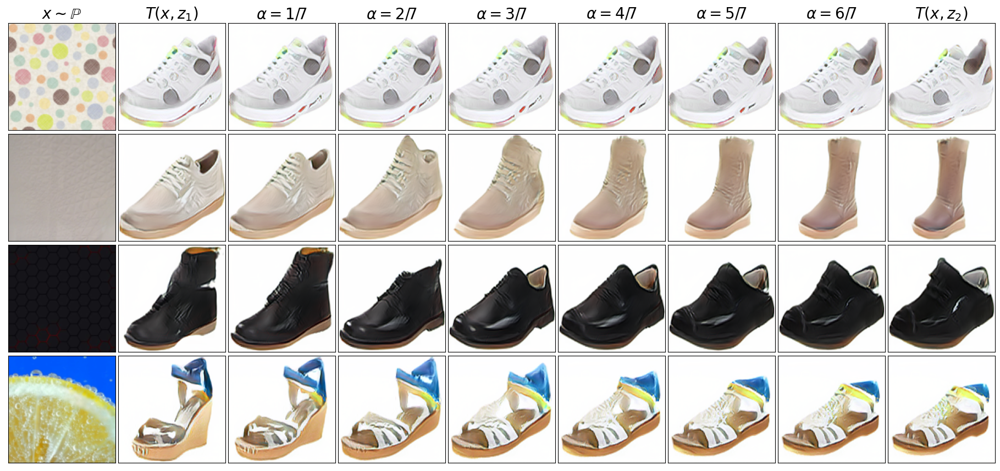

In [7]:
Z_SIZE = 8 if IMG_SIZE == 128 else 11
fig, axes = plt.subplots(4, Z_SIZE+1, figsize=((Z_SIZE+1)*2,8+0.4), dpi=100)  

X = X_test_sampler.sample(4)[:,None].repeat(1,Z_SIZE,1,1,1)
with torch.no_grad():
    Z = torch.randn(X.size(0), Z_SIZE, ZC, 1, 1, device='cuda') * Z_STD
    for i in range(Z_SIZE):
        Z[:, i] = Z[:, 0]*(1.-i/(Z_SIZE-1)) + Z[:,-1]*(i/(Z_SIZE-1))
    T_XZ = T(
        X.flatten(start_dim=0, end_dim=1), Z.flatten(start_dim=0, end_dim=1)
    ).permute(1,2,3,0).reshape(3, IMG_SIZE, IMG_SIZE, -1, Z_SIZE).permute(3,4,0,1,2)

with torch.no_grad():
    for j in range(4):
        axes[j,0].imshow(X[j, 0].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1))
        for i in range(Z_SIZE):
            axes[j,i+1].imshow(T_XZ[j,i].permute(1, 2, 0).add(1).mul(0.5).cpu().numpy().clip(0,1))

for i in range(1,Z_SIZE-1):
    title = '\\alpha={}/{}'.format(i,Z_SIZE-1)
    axes[0,i+1].set_title(r'${}$'.format(title), fontsize=20 if IMG_SIZE==128 else 25)
axes[0,0].set_title(r'$x\sim\mathbb{P}$', fontsize=20 if IMG_SIZE==128 else 25)
axes[0,1].set_title(r'$T(x,z_1)$', fontsize=20 if IMG_SIZE==128 else 25)
axes[0,-1].set_title(r'$T(x,z_2)$', fontsize=20 if IMG_SIZE==128 else 25)

for i, ax in enumerate(axes.flatten()):
    ax.get_xaxis().set_visible(False)
    ax.set_yticks([])

fig.tight_layout(pad=0.001)
fig.show()